# Load tfrecords, define model and train

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Dependencies

 # TensorFlow and tf.keras
import tensorflow as tf
print('Tensorflow Version:', tf.__version__)
from tensorflow import keras
from keras import layers
from keras import models

# Load the TensorBoard notebook extension
%load_ext tensorboard

# Helper libraries
import os
import os.path
import glob
import librosa
import librosa.display
import json
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as pd
import pprint
import datetime
from scipy.io.wavfile import write

# Check if the GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")



Tensorflow Version: 2.12.0
GPU available (YESS!!!!)


# funcs

In [3]:
# autotune for performance
AUTOTUNE = tf.data.experimental.AUTOTUNE

# decode tfrecords
def decode_tf_records(seralized_example):
    feature_description = {
        "voicefixer": tf.io.FixedLenFeature([], tf.string),
        "produced": tf.io.FixedLenFeature([], tf.string),
    }
    example = tf.io.parse_single_example(seralized_example, feature_description)

    voicefixer, _ = tf.audio.decode_wav(example["voicefixer"], desired_channels=-1)
    produced, _ = tf.audio.decode_wav(example["produced"], desired_channels=-1)

    return voicefixer, produced


def slicing_audio(voicefixer, produced):
    # generate random integer between 0 and 10*44100-3*44100
    random_int = tf.random.uniform(shape=[], minval=0, maxval=7*44100, dtype=tf.int32)
    # slice audio
    voicefixer = voicefixer[random_int:random_int+3*44100]
    produced = produced[random_int:random_int+3*44100]
    return voicefixer, produced


#--------------------------------------------
# helper func
def float2pcm(sig, dtype='int16'):
    sig = np.asarray(sig)
    if sig.dtype.kind != 'f':
        raise TypeError("'sig' must be a float array")
    dtype = np.dtype(dtype)
    if dtype.kind not in 'iu':
        raise TypeError("'dtype' must be an integer type")

    i = np.iinfo(dtype)
    abs_max = 2 ** (i.bits - 1)
    offset = i.min + abs_max
    return (sig * abs_max + offset).clip(i.min, i.max).astype(dtype)


#--------------------------------------------
# get audiofile from dataset and use as input for prediction
def set_speechfile(test_dataset, log_dir):


    dataset = test_dataset.unbatch().as_numpy_iterator()
    speech_for_predicition = []
    for i, sample in enumerate(dataset):
        speech_for_predicition.append(sample[0])
        break
    # # normalize speechfile
    speech_for_predicition = speech_for_predicition[0]
    speech_for_predicition = librosa.util.normalize(speech_for_predicition)

    # save speech file used for prediction
    # save plot to disk
    plt.figure(figsize=(8, 4))
    x = np.arange(0, len(speech_for_predicition)/44100, 1/44100)
    plt.plot(x, speech_for_predicition)
    plt.title('Speechfile used for prediction')
    plt.xlabel('Time in s')
    plt.ylabel('Amplitude')
    plt.savefig(log_dir + '/_audiofile_for_prediction.png')
    plt.show()

    # save audiofile to disk
    write(log_dir + '/_audiofile_for_prediction' + '.wav', int(44100), float2pcm(speech_for_predicition))

    return speech_for_predicition


#--------------------------------------------
# save audio files from logs to tf.summary.audio and event files for tensorboard
def save_audio_to_summaries(log_dir):

        # get audio files from logs
        fps = glob.glob(log_dir + '/*.wav')
        path_audiosummary = log_dir + '/audiosummary/'

        # for each audio file
        for idx, fp in enumerate(fps):

            # write audiosummary of one audio file to disk
             writer = tf.summary.create_file_writer(path_audiosummary)
             with writer.as_default():

                # load audio file as tensor
                file = tf.io.read_file(fp)
                audio = tf.audio.decode_wav(file, desired_channels=1)

                # write audio file to tf.summary.audio
                name = fp.split('/')[-1]
                tf.summary.audio(name , tf.expand_dims(audio[0], 0), int(44100), step=idx)
                writer.flush()


#--------------------------------------------
import tensorflow as tf

class TFSpectralConvergence(tf.keras.layers.Layer):
    """Spectral convergence loss."""

    def __init__(self):
        """Initialize."""
        super().__init__()

    def call(self, y_mag, x_mag):
        """Calculate forward propagation.
        Args:
            y_mag (Tensor): Magnitude spectrogram of groundtruth signal (B, #frames, #freq_bins).
            x_mag (Tensor): Magnitude spectrogram of predicted signal (B, #frames, #freq_bins).
        Returns:
            Tensor: Spectral convergence loss value.
        """
        return tf.norm(y_mag - x_mag, ord="fro", axis=(-2, -1)) / tf.norm(y_mag, ord="fro", axis=(-2, -1))


class TFLogSTFTMagnitude(tf.keras.layers.Layer):
    """Log STFT magnitude loss module."""

    def __init__(self):
        """Initialize."""
        super().__init__()

    def call(self, y_mag, x_mag):
        """Calculate forward propagation.
        Args:
            y_mag (Tensor): Magnitude spectrogram of groundtruth signal (B, #frames, #freq_bins).
            x_mag (Tensor): Magnitude spectrogram of predicted signal (B, #frames, #freq_bins).
        Returns:
            Tensor: Spectral convergence loss value.
        """
        return tf.abs(tf.math.log(y_mag) - tf.math.log(x_mag))


class TFSTFT(tf.keras.layers.Layer):
    """STFT loss module."""

    def __init__(self, frame_length=600, frame_step=120, fft_length=1024):
        """Initialize."""
        super().__init__()
        self.frame_length = frame_length
        self.frame_step = frame_step
        self.fft_length = fft_length
        self.spectral_convergenge_loss = TFSpectralConvergence()
        self.log_stft_magnitude_loss = TFLogSTFTMagnitude()

    def call(self, y, x):
        """Calculate forward propagation.
        Args:
            y (Tensor): Groundtruth signal (B, T).
            x (Tensor): Predicted signal (B, T).
        Returns:
            Tensor: Spectral convergence loss value (pre-reduce).
            Tensor: Log STFT magnitude loss value (pre-reduce).
        """

        x = tf.transpose(x, perm=[0, 2, 1])
        y = tf.transpose(y, perm=[0, 2, 1])

        x_mag = tf.abs(tf.signal.stft(signals=x,
                                      frame_length=self.frame_length,
                                      frame_step=self.frame_step,
                                      fft_length=self.fft_length))
        y_mag = tf.abs(tf.signal.stft(signals=y,
                                      frame_length=self.frame_length,
                                      frame_step=self.frame_step,
                                      fft_length=self.fft_length))

        # add small number to prevent nan value.
        # compatible with pytorch version.
        x_mag = tf.math.sqrt(x_mag ** 2 + 1e-7)
        y_mag = tf.math.sqrt(y_mag ** 2 + 1e-7)

        sc_loss = self.spectral_convergenge_loss(y_mag, x_mag)
        mag_loss = self.log_stft_magnitude_loss(y_mag, x_mag)

        return sc_loss, mag_loss


class TFMultiResolutionSTFT(tf.keras.layers.Layer):
    """Multi resolution STFT loss module."""

    def __init__(self,
                 fft_lengths=[1024, 2048, 512],
                 frame_lengths=[600, 1200, 240],
                 frame_steps=[120, 240, 50],):
        """Initialize Multi resolution STFT loss module.
        Args:
            frame_lengths (list): List of FFT sizes.
            frame_steps (list): List of hop sizes.
            fft_lengths (list): List of window lengths.
        """
        super().__init__()
        assert len(frame_lengths) == len(frame_steps) == len(fft_lengths)
        self.stft_losses = []
        for frame_length, frame_step, fft_length in zip(frame_lengths, frame_steps, fft_lengths):
            self.stft_losses.append(TFSTFT(frame_length, frame_step, fft_length))

    def call(self, y, x):
        """Calculate forward propagation.
        Args:
            y (Tensor): Groundtruth signal (B, T).
            x (Tensor): Predicted signal (B, T).
        Returns:
            Tensor: Multi resolution spectral convergence loss value.
            Tensor: Multi resolution log STFT magnitude loss value.
        """
        sc_loss = 0.0
        mag_loss = 0.0
        for f in self.stft_losses:
            sc_l, mag_l = f(y, x)
            sc_loss += tf.reduce_mean(sc_l)
            mag_loss += tf.reduce_mean(mag_l)

        sc_loss /= len(self.stft_losses)
        mag_loss /= len(self.stft_losses)

        return mag_loss


class CustomLoss(tf.keras.losses.Loss):
    """custom loss calculated from MAE and Multiresolution STFT loss"""

    def __init__(self):
        super().__init__()
        self.mae = tf.keras.losses.MeanAbsoluteError()
        self.stft = TFMultiResolutionSTFT()


    def call(self, y_true, y_pred):
        mae = self.mae(y_true, y_pred)
        stft = self.stft(y_true, y_pred)
        return ((mae+stft) / 2)




# define some values in config

In [4]:
# define some values in config
config = {
          'batch_size': 16,
          'shuffle_buffer_size': 300,
          'n_epochs': 20,
          'sr': 44100,
          # Filter:Kernel = 4:1 (see hifi-gan paper)
          'filter_size': 16,
          'kernel_size': 4,
          'learning_rate': 0.004
          }


# loading data

In [5]:
# load train tfrecords
tfrecords_paths = glob.glob('/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/Dataset/train_tfrecords/*.tfrecords')

## load smaller dataset
# set = int(np.round((len(tfrecords_paths)/20)))
# train_dataset = tf.data.TFRecordDataset(tfrecords_paths[:set])

# load full dataset
train_dataset = tf.data.TFRecordDataset(tfrecords_paths)

# preprocess dataset
train_dataset = train_dataset.map(decode_tf_records, num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.map(slicing_audio, num_parallel_calls=AUTOTUNE)

# # count elements in train_dataset
#print(f'Number of elements in train_dataset: {len([d for d in train_dataset])}')

# batching and shuffling
train_dataset = train_dataset.shuffle(config['shuffle_buffer_size']).batch(config['batch_size'])


In [6]:
# load test tfrecords
tfrecords_paths = glob.glob('/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/Dataset/test_tfrecords/*.tfrecords')

## load smaller dataset
# set = int(np.round((len(tfrecords_paths)/20)))
# test_dataset = tf.data.TFRecordDataset(tfrecords_paths[:set])

# load full dataset
test_dataset = tf.data.TFRecordDataset(tfrecords_paths)

# preprocess dataset
test_dataset = test_dataset.map(decode_tf_records, num_parallel_calls=AUTOTUNE)
test_dataset = test_dataset.map(slicing_audio, num_parallel_calls=AUTOTUNE)

# # count elements in test_dataset
#print(f'Number of elements in test_dataset: {len([d for d in test_dataset])}')

# batching and shuffling
test_dataset = test_dataset.shuffle(config['shuffle_buffer_size']).batch(config['batch_size'])


# look at data

In [7]:
# # look at some example data from train dataset
# wavs = train_dataset.unbatch().as_numpy_iterator()
# noisy = []
# gt = []

# # Setup Subplot
# nrows, ncols = 2, 2
# fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, figsize=(16, 9))


# # iterate over dataset
# for i, sample in enumerate(wavs):

#     # get the column and row by modulo and remainder
#     j = i % ncols
#     k = int(i / ncols)

#     # extract noisy and produced speech file from tensors
#     wave = sample[0]
#     ground_truth = sample[1]

#     # plot files
#     librosa.display.waveshow(np.squeeze(wave), x_axis='time', sr=config['sr'], ax=ax[k][j], label='test_file')
#     librosa.display.waveshow(np.squeeze(ground_truth), alpha=0.3, x_axis='time', sr=config['sr'], ax=ax[k][j], label='ground_truth')
#     ax[k][j].legend()
#     ax[k][j].axis('on')
#     ax[k][j].set_title('10s speech')

#     # save speech to arrays
#     noisy.append(np.squeeze(wave))
#     gt.append(np.squeeze(ground_truth))

#     if i+1 == ncols*nrows:
#         break

# # adjust whitespace in between subplots
# plt.subplots_adjust(hspace=0.25, wspace=0.15)
# plt.show()


# # listen to the audio samples
# for i in range(len(gt)):
#     print(f'----------- {i+1}. speechsnippet ---------------')
#     print('')
#     print(f'Voicefixer file')
#     pd.display(pd.Audio(noisy[i].T, rate=config['sr']))
#     print(f'corresponding produced file')
#     pd.display(pd.Audio(gt[i].T, rate=config['sr']))
#     print('')

# Model architecture

In [8]:
# some values for the model
input_shape = (3*44100, 1)
output_channels = 1
filter_size = config['filter_size']
kernel_size = config['kernel_size']


# build model with 12 layers
def build_model(input_shape):

    # define model
    model = keras.Sequential(name='PostNet_Conv1D')
    model.add(keras.Input(shape=input_shape))

    # add layer
    model.add(keras.layers.Conv1D(filters=filter_size, kernel_size=kernel_size, padding='same'))
    model.add(keras.layers.Activation('tanh'))

    # Add the remaining Conv1D layers
    for _ in range(11):
        model.add(keras.layers.Conv1D(filters=filter_size, kernel_size=kernel_size, padding='same'))
        model.add(keras.layers.Activation('tanh'))

    # Add the final Conv1D layer
    model.add(keras.layers.Conv1D(filters=output_channels, kernel_size=1, padding='same'))
    #model.add(keras.layers.Activation('tanh'))

    return model

# callbacks and compile

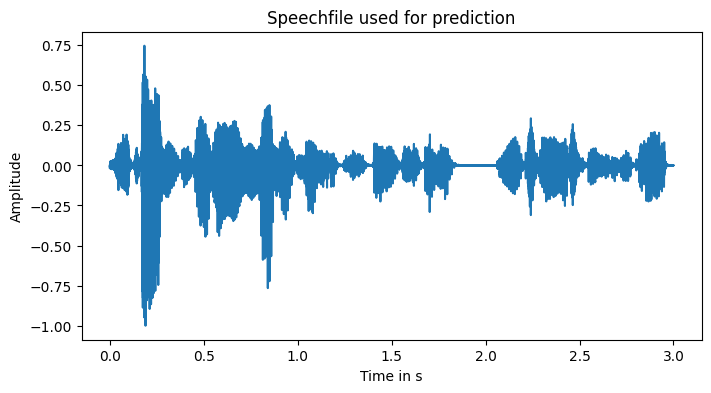

Model: "PostNet_Conv1D"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 132300, 16)        80        
                                                                 
 activation (Activation)     (None, 132300, 16)        0         
                                                                 
 conv1d_1 (Conv1D)           (None, 132300, 16)        1040      
                                                                 
 activation_1 (Activation)   (None, 132300, 16)        0         
                                                                 
 conv1d_2 (Conv1D)           (None, 132300, 16)        1040      
                                                                 
 activation_2 (Activation)   (None, 132300, 16)        0         
                                                                 
 conv1d_3 (Conv1D)           (None, 132300, 16)     

In [9]:
#--------------------------------------------
# define callbacks
log_dir = '/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/logs/' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
checkpoint_dir = '/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/model_checkpoint'

# make directory if not exist
if not os.path.exists(log_dir):
    os.makedirs(log_dir)


save_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_dir,
    save_best_only=False,
    monitor='val_loss',
    verbose=0)

tensorboard_callback = keras.callbacks.TensorBoard(
    log_dir= log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=True,
    write_steps_per_second=True,
    update_freq='epoch',
    profile_batch=0,
    embeddings_freq=1)

# early_stopping_callback = keras.callbacks.EarlyStopping(
#     monitor='val_loss',
#     patience=5,
#     verbose=1)


# get speechfile for prediction
speech_for_predicition = set_speechfile(test_dataset, log_dir)


#--------------------------------------------
# define custom callback
class CustomCallback(keras.callbacks.Callback):

    # define functions to happen during training after each epoch
    def on_epoch_end(self, epoch, logs=None):

        # # print(logs)
        # print('---------------------')
        # print(f'Epoch {epoch+1} Metrics:')
        # print(logs)
        # print('---------------------')
        # print('')


        # save predicted audio file after each epoch to disk
        # get audio file from model prediciton
        audio = self.model.predict(speech_for_predicition)

        # change shape to (len(audio), 1)
        audio = tf.squeeze(audio, axis=-1).numpy()

        # normalize audio with numpy
        audio = librosa.util.normalize(audio).astype(np.float32)

        # save plot to disk
        plt.figure(figsize=(8, 4))
        x = np.arange(0, len(audio)/44100, 1/44100)
        plt.plot(x, audio)
        plt.title('Audiofile')
        plt.xlabel('Time in s')
        plt.ylabel('Amplitude')
        plt.savefig(log_dir + '/_audiofile_epoch' + str(epoch+1) + '.png')
        plt.close()

        # write audio file to disk (16-bit PCM WAV)
        write(log_dir + '/_audiofile_epoch' + str(epoch+1) + '.wav', 44100, float2pcm(audio))


#--------------------------------------------
# get model
model = build_model(input_shape = input_shape)

# compile model
model.compile(optimizer = keras.optimizers.Adam(learning_rate=config['learning_rate']),
              loss = CustomLoss(),
              metrics = tf.keras.losses.MeanAbsoluteError())

model.summary()


In [28]:
# # Clear any logs from previous runs
# !rm -rf '/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/logs'

# fit model and save audio summaries for tensorboard

In [11]:
# fit model
history = model.fit(train_dataset,
                    epochs=config['n_epochs'],
                    validation_data=test_dataset,
                    callbacks=[save_callback, tensorboard_callback, CustomCallback()])

# save model
model.save('/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/model.h5')

# save history
with open('/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/history.json', 'w+') as fp:
    json.dump(history.history, fp, sort_keys=True, indent=4)


# call def to save audio to summaries
save_audio_to_summaries(log_dir)


Epoch 1/20
    927/Unknown - 600s 621ms/step - loss: 0.5857 - mean_absolute_error: 0.0950

927/927 [==============================] - 686s 713ms/step - loss: 0.5857 - mean_absolute_error: 0.0950 - val_loss: 0.5671 - val_mean_absolute_error: 0.0750
Epoch 2/20
926/927 [============================>.] - ETA: 0s - loss: 0.5617 - mean_absolute_error: 0.0871

927/927 [==============================] - 548s 580ms/step - loss: 0.5617 - mean_absolute_error: 0.0871 - val_loss: 0.5603 - val_mean_absolute_error: 0.0909
Epoch 3/20
926/927 [============================>.] - ETA: 0s - loss: 0.5545 - mean_absolute_error: 0.0860

927/927 [==============================] - 546s 581ms/step - loss: 0.5545 - mean_absolute_error: 0.0860 - val_loss: 0.5599 - val_mean_absolute_error: 0.0741
Epoch 4/20
926/927 [============================>.] - ETA: 0s - loss: 0.5531 - mean_absolute_error: 0.0868

927/927 [==============================] - 529s 559ms/step - loss: 0.5531 - mean_absolute_error: 0.0868 - val_loss: 0.5381 - val_mean_absolute_error: 0.0717
Epoch 5/20
926/927 [============================>.] - ETA: 0s - loss: 0.5583 - mean_absolute_error: 0.0922

927/927 [==============================] - 551s 584ms/step - loss: 0.5583 - mean_absolute_error: 0.0922 - val_loss: 0.5471 - val_mean_absolute_error: 0.0899
Epoch 6/20
926/927 [============================>.] - ETA: 0s - loss: 0.5499 - mean_absolute_error: 0.0912

927/927 [==============================] - 546s 580ms/step - loss: 0.5499 - mean_absolute_error: 0.0911 - val_loss: 0.5443 - val_mean_absolute_error: 0.0710
Epoch 7/20
926/927 [============================>.] - ETA: 0s - loss: 0.5469 - mean_absolute_error: 0.0920

927/927 [==============================] - 559s 593ms/step - loss: 0.5468 - mean_absolute_error: 0.0920 - val_loss: 0.5265 - val_mean_absolute_error: 0.0768
Epoch 8/20
926/927 [============================>.] - ETA: 0s - loss: 0.5431 - mean_absolute_error: 0.0923

927/927 [==============================] - 546s 580ms/step - loss: 0.5431 - mean_absolute_error: 0.0923 - val_loss: 0.5291 - val_mean_absolute_error: 0.0815
Epoch 9/20
926/927 [============================>.] - ETA: 0s - loss: 0.5407 - mean_absolute_error: 0.0928

927/927 [==============================] - 572s 604ms/step - loss: 0.5407 - mean_absolute_error: 0.0928 - val_loss: 0.5200 - val_mean_absolute_error: 0.0751
Epoch 10/20
926/927 [============================>.] - ETA: 0s - loss: 0.5507 - mean_absolute_error: 0.0979

927/927 [==============================] - 543s 576ms/step - loss: 0.5507 - mean_absolute_error: 0.0979 - val_loss: 0.5335 - val_mean_absolute_error: 0.0845
Epoch 11/20
926/927 [============================>.] - ETA: 0s - loss: 0.5386 - mean_absolute_error: 0.0931

927/927 [==============================] - 574s 607ms/step - loss: 0.5386 - mean_absolute_error: 0.0931 - val_loss: 0.5317 - val_mean_absolute_error: 0.0788
Epoch 12/20
926/927 [============================>.] - ETA: 0s - loss: 0.5377 - mean_absolute_error: 0.0942

927/927 [==============================] - 547s 581ms/step - loss: 0.5377 - mean_absolute_error: 0.0942 - val_loss: 0.5259 - val_mean_absolute_error: 0.0736
Epoch 13/20
926/927 [============================>.] - ETA: 0s - loss: 0.5686 - mean_absolute_error: 0.1063

927/927 [==============================] - 547s 579ms/step - loss: 0.5686 - mean_absolute_error: 0.1064 - val_loss: 0.5823 - val_mean_absolute_error: 0.1496
Epoch 14/20
926/927 [============================>.] - ETA: 0s - loss: 0.5744 - mean_absolute_error: 0.1339

927/927 [==============================] - 538s 569ms/step - loss: 0.5744 - mean_absolute_error: 0.1339 - val_loss: 0.5426 - val_mean_absolute_error: 0.0795
Epoch 15/20
926/927 [============================>.] - ETA: 0s - loss: 0.5607 - mean_absolute_error: 0.1164

927/927 [==============================] - 575s 607ms/step - loss: 0.5607 - mean_absolute_error: 0.1164 - val_loss: 0.5376 - val_mean_absolute_error: 0.0821
Epoch 16/20
926/927 [============================>.] - ETA: 0s - loss: 0.5432 - mean_absolute_error: 0.0970

927/927 [==============================] - 544s 576ms/step - loss: 0.5432 - mean_absolute_error: 0.0969 - val_loss: 0.5219 - val_mean_absolute_error: 0.0784
Epoch 17/20
926/927 [============================>.] - ETA: 0s - loss: 0.5392 - mean_absolute_error: 0.0954

927/927 [==============================] - 578s 612ms/step - loss: 0.5392 - mean_absolute_error: 0.0954 - val_loss: 0.5306 - val_mean_absolute_error: 0.0875
Epoch 18/20
926/927 [============================>.] - ETA: 0s - loss: 0.5531 - mean_absolute_error: 0.0993

927/927 [==============================] - 570s 605ms/step - loss: 0.5530 - mean_absolute_error: 0.0992 - val_loss: 0.5226 - val_mean_absolute_error: 0.0741
Epoch 19/20
926/927 [============================>.] - ETA: 0s - loss: 0.5391 - mean_absolute_error: 0.0947

927/927 [==============================] - 609s 647ms/step - loss: 0.5391 - mean_absolute_error: 0.0947 - val_loss: 0.5312 - val_mean_absolute_error: 0.0770
Epoch 20/20
926/927 [============================>.] - ETA: 0s - loss: 0.5502 - mean_absolute_error: 0.1142

927/927 [==============================] - 596s 632ms/step - loss: 0.5502 - mean_absolute_error: 0.1142 - val_loss: 0.5242 - val_mean_absolute_error: 0.0765


In [ ]:
# !kill 10535

In [15]:
# Load the TensorBoard notebook extension

%tensorboard --logdir '/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/logs'

<IPython.core.display.Javascript object>

# easy Plot

In [14]:
# check out history
# open history
with open('/content/drive/MyDrive/#Post_processing_net_for_speech_enhancement/history.json', 'r') as fp:
  hist = json.loads(fp.read())


print(hist.keys())


JSONDecodeError: ignored

In [1]:
# plot losses
train_loss = hist['loss']
eval_loss = hist['val_loss']

fig2 = plt.figure()
plt.plot(range(config['n_epochs']), train_loss, label='train')
plt.plot(range(config['n_epochs']), eval_loss, label='eval')
plt.legend()
plt.grid(True)
plt.xlabel('Epochs')
plt.ylabel('Custom Loss')
plt.title('Training with '
                           + str(config['n_epochs'])
                           + ' epochs \n batch-size: '
                           + str(config['batch_size']))

plt.show()

NameError: ignored